# EDA: SiMWiSense: Simultaneous Multi-Subject Activity Classification Through Wi-Fi Signals
- Dataport: https://ieee-dataport.org/documents/dataset-simultaneous-multi-subject-activity-classification-through-wi-fi-signals

Equipe: Nobuko e Diogo



Novidades em Maio/2025
1. Nomes das atividades no SiMWisense e Beamsense.
2. Entendendo melhor os dados do conjunto Coarse
3. Valores min, max por subportadora
4. Bias do dataset
5. Plotando TSNE do dataset



Abril/2025
Resumo do notebook

1. Introdução
2. Arquivos PCAP (dado bruto)
3. Extração do CSI dos PCAP
4. Divisão das matrizes em slots e batches
5. Criando CSVs
6. Exemplos das amostras



----
# **1. Introdução**

Em contraste com a maioria dos datasets de Wi-Fi sensing que se concentram na classificação de atividades de um único indivíduo por vez, este dataset foi desenvolvido a partir de uma de coleta com três indivíduos executando simultaneamente 20 atividades diferentes. A coleta foi realizada com o uso de múltiplos monitores de CSI, em ~~3~~ **2** ambientes distintos: (Sala de aula, escritório e ~~cozinha~~).

A base da coleta é o uso do Channel State Information (CSI) — uma métrica da camada física do Wi-Fi, utilizada em estimativas e equalizações de canal. O CSI é altamente sensível a alterações no ambiente físico, sendo capaz de capturar variações provocadas por qualquer entidade presente entre o transmissor e o receptor. 


**Resumo das características do dataset:**
- Número de indivíduos: 3.
- Tipo de atividades: 20 atividades distintas realizadas simultaneamente.
- Ambientes: ~~3~~ **2** (Sala de aula, escritório e ~~cozinha~~)
- Dispositivos utilizados: 3 monitores de CSI e 1 Access Point (AP)

**Hardware utilizado:**
- 1 Netgear Nighthawk X4S AC2600 (Access Point)  IEEE 802.11ac Wifi5
- 3 Asus RT-AC86U (monitores) IEEE 802.11ac Wifi5 com firmware alterado para captura
- Firmware para captura: Nexmon (também disponível no Raspiberry Pi B3+/B4)

**Cenário dos experimentos**
```
+--------------------------------------------------+
|    [M1]              [M2]               [M3]     |
|                                                  |
| /--------\        /--------\         /--------\  |
| | Zona 1 |        | Zona 2 |         | Zona 3 |  |
| \--------/        \--------/         \--------/  |
|                                                  |
|                                                  |
|                                                  |
|                                                  |
|                      (AP)                        |
|                        🔵                        |
+--------------------------------------------------+
```
</br>

**Tipos de teste**
No README do repositório, os testes são descritos da seguinte forma:
| Teste | Descrição |
|:------|:----------|
| **Proximity Test** | Resolve o problema da classificação simultânea de múltiplos sujeitos, utilizando o CSI do dispositivo mais próximo. Experimentalmente, é comprovado que a melhor acurácia é obtida com o transceptor mais próximo do sujeito. |
| **Coarse Detection** | Propõe uma detecção descentralizada para múltiplos sujeitos, atribuindo um modelo de aprendizado a cada dispositivo para identificar o sujeito mais próximo. Refere-se à identificação do sujeito (**subject identification**). |
| **Fine-Grained Detection** | Após a identificação do sujeito, um segundo modelo de deep learning é usado para classificar as atividades de forma mais precisa. |

</br>

**O que não tem:** 
- O dataset não tem os dados do ambiente da cozinha.
- Os vídeos capturados para gerar o ground truth também não estão no dataset.

**Descrição das 20 atividades (no SiWiSense):**
1. push forward, 
2. rotate, 
3. hands up and down, 
4. waive,
5. brush, 
6. clap, 
7. sit, 
8. eat, 
9. drink, 
10. kick, 
11. bend forward, 
12. wash hands, 
13. call,
14. browsing phone, 
15. check wrist, 
16. read, 
17. waive while sitting, 
18. writing,
19. side bend, 
20. standing 


**Descrição das 20 atividades (no Beamsense):**
1. jogging
2. clapping
3. push forward, 
4. boxing,
5. writing, 
6. brushing teeth, 
7. rotating, 
8. standing, 
9. eating, 
10. reading a book, 
11. waiving, 
12. walking, 
13. browsing phone, 
14. drinking, hands-up-down, 
15. phone call, 
16. side bend, 
17. check the wrist (watch), 
18. washing hands, 
19. browsing laptop. 

----
# **2. Arquivos PCAP (dado bruto)**

O repositório disponibiliza um arquivo .zip com aproximadamente 191 GB de dados. Esse arquivo é composto principalmente por múltiplos arquivos PCAP, contendo capturas de tráfego de rede. Além dos PCAPs, o .zip inclui diversos arquivos placeholder. O download completo levou cerca de 2 horas.


Focando nas pastas com PCAPs temos o seguninte:
```
Data
├── [proximity, coarse, fine_grained]   → São os 3 testes.
├──── [Classroom, Office]               → O lugar onde foi realizada a coleta.
├────── 80MHz/3mo                       → largura de banda e quantidade de monitores.
├──────── [m1, m2, m3]                  → medicões de cada monitor.
├────────── CSI_pcap                    → onde estão os arquivos .pcap.
├────────────[A,B,C,...].pcap           → o nome do arquivo já indica a atividade.
```

In [4]:
!find ../Data -type d -name CSI_pcap | while read dir; do     count=$(find "$dir" -maxdepth 1 -name '*.pcap' | wc -l);     total_bytes=$(find "$dir" -maxdepth 1 -name '*.pcap' -exec du -bc {} + | grep total$ | awk '{print $1}');     if [ "$count" -gt 0 ]; then         avg_bytes=$((total_bytes / count));         avg_human=$(numfmt --to=iec --suffix=B "$avg_bytes");         total_human=$(numfmt --to=iec --suffix=B "$total_bytes");     else         avg_human="N/A";         total_human="0B";     fi;     BLUE='\033[1;34m';     GREEN='\033[1;32m';     YELLOW='\033[1;33m';     MAGENTA='\033[1;35m';     NC='\033[0m' ;     echo -e "${BLUE}$dir${NC} -> ${GREEN}$count arquivos${NC}, ${YELLOW}Total: $total_human${NC}, ${MAGENTA}Média: $avg_human${NC}"; done

../Data/coarse/Classroom/80MHz/3mo/m2/CSI_pcap -> 4 arquivos, Total: 1,7GB, Média: 421MB
../Data/coarse/Classroom/80MHz/3mo/m3/CSI_pcap -> 4 arquivos, Total: 1,7GB, Média: 423MB
../Data/coarse/Classroom/80MHz/3mo/m1/CSI_pcap -> 4 arquivos, Total: 1,7GB, Média: 420MB
../Data/coarse/Office/80MHz/3mo/m2/CSI_pcap -> 4 arquivos, Total: 1,8GB, Média: 458MB
../Data/coarse/Office/80MHz/3mo/m3/CSI_pcap -> 4 arquivos, Total: 1,7GB, Média: 428MB
../Data/coarse/Office/80MHz/3mo/m1/CSI_pcap -> 4 arquivos, Total: 1,7GB, Média: 432MB
../Data/proximity/Classroom/80MHz/3mo/m2/CSI_pcap -> 20 arquivos, Total: 14GB, Média: 704MB
../Data/proximity/Classroom/80MHz/3mo/m3/CSI_pcap -> 20 arquivos, Total: 15GB, Média: 727MB
../Data/proximity/Classroom/80MHz/3mo/m1/CSI_pcap -> 20 arquivos, Total: 14GB, Média: 710MB
../Data/proximity/Office/80MHz/3mo/m2/CSI_pcap -> 20 arquivos, Total: 23GB, Média: 1,2GB
../Data/proximity/Office/80MHz/3mo/m3/CSI_pcap -> 20 arquivos, Total: 22GB, Média: 1,1GB
../Data/proximity/Off

## Observações
- Nos testes **proximity** e **fine_grained**, há 20 arquivos PCAP nomeados de A.pcap a T.pcap. (20 atividades)
- No teste **coarse**, existem apenas 4 arquivos PCAP (A.pcap a D.pcap), o que sugere que o modelo de identificação dos indivíduos não precisou ser treinado com todas as atividades.
- O tamanho dos arquivos PCAP varia entre os testes, o que possivelmente reflete diferenças no tempo de captura dos dados.
- No total são 264 arquivos PCAP.
  - 120 **proximity**
  - 24 **coarse**
  - 129 **fine_grained**

In [1]:
# Setup
import os
import pandas as pd
import numpy as np
import h5py
import scipy.io
import string

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import matplotlib as mpl
import seaborn as sns


from scapy.all import RawPcapReader
from datetime import datetime
from pathlib import Path
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

In [6]:
# Função para resumir arquivos PCAP
def summarize_pcap(file_path, verbose=False):
  file_size_bytes = os.path.getsize(file_path)
  reader = RawPcapReader(file_path)
    
  num_packets = 0
  start_time = None
  end_time = None

  for pkt_data, pkt_metadata in reader:
    ts = pkt_metadata.sec + pkt_metadata.usec / 1_000_000
    if start_time is None:
      start_time = ts
    end_time = ts
    num_packets += 1

  reader.close()

  start_dt = datetime.fromtimestamp(start_time)
  end_dt = datetime.fromtimestamp(end_time)
  duration = end_time - start_time
  file_size_mb = file_size_bytes / (1024 * 1024)    # Convert bytes to megabytes

  if verbose:
    print("📄 PCAP Summary:")
    print(f"- Number of packets: {num_packets}")
    print(f"- Start time       : {start_dt}")
    print(f"- End time         : {end_dt}")
    print(f"- Duration         : {duration:.6f} seconds")
    print(f"- File size        : {file_size_mb:.2f} MB")

  return (num_packets, start_dt, end_dt, duration, file_size_mb)

# Exemplo de uso
file_path = "../Data/coarse/Classroom/80MHz/3mo/m2/CSI_pcap/A.pcap" 
num_packets, start_dt, end_dt, duration, file_size_mb = summarize_pcap(file_path, verbose=True)

📄 PCAP Summary:
- Number of packets: 400604
- Start time       : 2018-05-05 04:41:20.467729
- End time         : 2018-05-05 04:46:30.719364
- Duration         : 310.251635 seconds
- File size        : 420.25 MB


In [7]:
# Extraindo resumo de todos os arquivos PCAP
# Salvando os resultados em um dicionário df.to_csv('SAIDAS/01-pcap_summary.csv', index=False)
def summarize_all_pcaps(output_file='SAIDAS/01-pcap_summary.csv'):
  if os.path.exists(output_file):
    return pd.read_csv('SAIDAS/01-pcap_summary.csv')
  else:
    df_proto = {
        'file_path': [],
        'num_packets': [],
        'start_time': [],
        'end_time': [],
        'duration': [],
        'file_size_mb': []
    }

    file_paths = Path('../Data').rglob('*.pcap')

    for file_path in tqdm(sorted(file_paths)):
      file_path = str(file_path)
      num_packets, start_dt, end_dt, duration, file_size_mb  = summarize_pcap(file_path)
      df_proto['file_path'].append(file_path)
      df_proto['num_packets'].append(num_packets)
      df_proto['start_time'].append(start_dt)
      df_proto['end_time'].append(end_dt)
      df_proto['duration'].append(duration)
      df_proto['file_size_mb'].append(file_size_mb)   

    return pd.DataFrame(df_proto).to_csv('SAIDAS/01-pcap_summary.csv', index=False)  

In [8]:
pcap_summary = summarize_all_pcaps()
pcap_summary.head()

,file_path,num_packets,start_time,end_time,duration,file_size_mb,test,environment,monitor,activity
0,../Data/coarse/Classroom/80MHz/3mo/m1/CSI_pcap...,397780,2018-05-05 04:08:53.974579,2018-05-05 04:14:04.204180,310.229601,417.287849,coarse,Classroom,m1,A
1,../Data/coarse/Classroom/80MHz/3mo/m1/CSI_pcap...,390882,2018-05-05 04:17:39.777768,2018-05-05 04:22:50.032895,310.255127,410.051559,coarse,Classroom,m1,B
2,../Data/coarse/Classroom/80MHz/3mo/m1/CSI_pcap...,402670,2018-05-05 04:33:40.558963,2018-05-05 04:38:50.808146,310.249183,422.417664,coarse,Classroom,m1,C
3,../Data/coarse/Classroom/80MHz/3mo/m1/CSI_pcap...,409930,2018-05-05 04:25:53.864638,2018-05-05 04:31:04.118338,310.253700,430.033707,coarse,Classroom,m1,D
4,../Data/coarse/Classroom/80MHz/3mo/m2/CSI_pcap...,400604,2018-05-05 04:41:20.467729,2018-05-05 04:46:30.719364,310.251635,420.250343,coarse,Classroom,m2,A


In [9]:
# Resumo dos arquivos PCAP
print(f'Total de arquivos PCAP: {len(pcap_summary)} ({pcap_summary["file_size_mb"].sum():.2f} MB)')
print()

print(f'Total de pacotes: {pcap_summary["num_packets"].sum()} ({pcap_summary["duration"].sum()/60:.2f} minutos)')
print()

print(f'Início da captura: {pcap_summary["start_time"].min()}')
print(f'   Fim da captura: {pcap_summary["end_time"].max()}')



Total de arquivos PCAP: 264 (229664.58 MB)

Total de pacotes: 218927963 (3420.30 minutos)

Início da captura: 2018-05-05 02:18:01.914463
   Fim da captura: 2018-05-05 13:48:44.733418


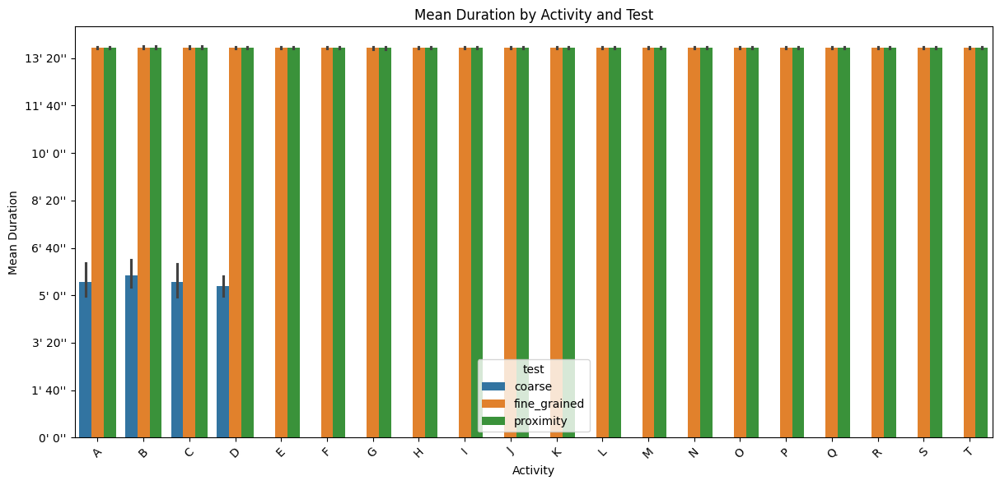

In [10]:
def plot_duration_by_activity_and_test(df):
  plt.figure(figsize=(12, 6))
  sns.barplot(x='activity', y='duration', hue='test', data=df, estimator='mean')
  plt.xticks(rotation=45)
  plt.title('Mean Duration by Activity and Test')
  plt.xlabel('Activity')
  plt.ylabel('Mean Duration')
  plt.tight_layout()
  plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{int(x // 60)}' {int(x % 60)}''"))

plot_duration_by_activity_and_test(pcap_summary)

# Esclarecendo a diferença no dataset Coarse

É o modelo utilizado para identificar a pessoa.

Aqui as classes são:
- **A** - Pessoa 1
- **B** - Pessoa 2
- **C** - Pessoa 3
- **D** - Sem atividade

-----
# **3. Extração do CSI dos arquivos PCAP**

O primeiro passo do pré-processamento é a **extração a informação de CSI** dos arquivos PCAP.

A extração é realizada executando o script `CSI_extractor_SimWiSense.m`, localizado no diretório `SiMWiSense/Matlab_code/`.

Antes de rodar o script, é necessário alterar o campo `Test="xxxx"` para o nome do teste desejado. Para extrair os dados de todos os três testes do conjunto, é necessário executar o script separadamente para:
- `Test="proximity"`
- `Test="coarse"`
- `Test="fine_grained"`


## Pontos Importantes

- **CSI (Channel State Information)** refere-se às informações do estado do canal, fundamentais para estimativas e equalizações no Wi-Fi.

- Cada amostra de CSI contém **dois valores** (amplitude e fase) para cada **subportadora**. No código, esses valores são representados como **números complexos**.

- A modulação Wi-Fi (no padrão utilizado) divide o sinal em **subportadoras ortogonais**. Para o canal de **80 MHz de largura de banda**, temos **256 subportadoras** no total.

- Entretanto, apenas as subportadoras efetivamente usadas para transmissão de dados são consideradas. No código, são selecionadas **242 subportadoras** (da 7 à 128 e da 132 à 251), descartando subportadoras do tipo *null* e *guard*.

- Portanto, **cada amostra de CSI em um instante **t** contém 242 números complexos**.

- A quantidade de amostras extraídas de um PCAP está relacionada ao **número de pacotes capturados** (isto é, à duração da gravação).

- Como visto anteriormente, temos **264 arquivos PCAP** no total, e este processo irá gerar exatamente **264 arquivos `.mat`**, contendo as extrações de CSI em formato de **matrizes do MATLAB**.

- **Os arquivos `.mat` gerados são ainda maiores do que os arquivos PCAP originais**.

- O código de extração **filtra pacotes com base no chip de Wi-Fi** utilizado. A maneira de extrair depende do chip. Para extrair o CSI de dentro dos pacotes, é utilizada uma função em C chamada `unpack_float_acphy`, vem de um exemplo do **NexMon**.




In [2]:
def summarize_mat_files(output_file='SAIDAS/02-mat_summary.csv'):
  if os.path.exists(output_file):
    return pd.read_csv('SAIDAS/02-mat_summary.csv')
  else:

    def getMinMax(mat_file_path):
      with h5py.File(mat_file_path, 'r') as f:
        csi_data = f['csi'][:]
        real = csi_data['real']
        imag = csi_data['imag']

        min_real = np.min(real)
        max_real = np.max(real)
        min_imag = np.min(imag)
        max_imag = np.max(imag)

        min_real_subcarriers = np.min(real, axis=1)
        max_real_subcarriers = np.max(real, axis=1)
        min_imag_subcarriers = np.min(imag, axis=1)
        max_imag_subcarriers = np.max(imag, axis=1)

        return min_real, max_real, min_imag, max_imag, csi_data.shape[0], csi_data.shape[1], min_real_subcarriers, max_real_subcarriers, min_imag_subcarriers, max_imag_subcarriers
      
    df_proto = {
      'file_path': [],
      'min_real': [],
      'max_real': [],
      'min_imag': [],
      'max_imag': [],
      'shape0': [],
      'shape1': []
    }

    for i in range(1, 243):
      df_proto[f'min_real_subcarrier_{i}'] = []
      df_proto[f'max_real_subcarrier_{i}'] = []
      df_proto[f'min_imag_subcarrier_{i}'] = []
      df_proto[f'max_imag_subcarrier_{i}'] = []

    file_paths = Path('../Data').rglob('*.mat')
    file_paths = [p for p in Path('../Data').rglob('*.mat') if 'Slot' not in str(p)]

    for file_path in tqdm(sorted(file_paths)):
      file_path = str(file_path)
      min_real, max_real, min_imag, max_imag, shape0, shape1, min_real_subcarriers, max_real_subcarriers, min_imag_subcarriers, max_imag_subcarriers = getMinMax(file_path)
      df_proto['file_path'].append(file_path)
      df_proto['min_real'].append(min_real)
      df_proto['max_real'].append(max_real)
      df_proto['min_imag'].append(min_imag)
      df_proto['max_imag'].append(max_imag)
      df_proto['shape0'].append(shape0)
      df_proto['shape1'].append(shape1)

      for i in range(1,243):
        df_proto[f'min_real_subcarrier_{i}'].append(min_real_subcarriers[i-1])
        df_proto[f'max_real_subcarrier_{i}'].append(max_real_subcarriers[i-1])
        df_proto[f'min_imag_subcarrier_{i}'].append(min_imag_subcarriers[i-1])
        df_proto[f'max_imag_subcarrier_{i}'].append(max_imag_subcarriers[i-1])

    df = pd.DataFrame(df_proto)
    df.to_csv('SAIDAS/02-mat_summary.csv', index=False)
    return df

mat_summary = summarize_mat_files()
mat_summary.head()

,file_path,min_real,max_real,min_imag,max_imag,shape0,shape1,min_real_subcarrier_1,max_real_subcarrier_1,min_imag_subcarrier_1,...,min_imag_subcarrier_240,max_imag_subcarrier_240,min_real_subcarrier_241,max_real_subcarrier_241,min_imag_subcarrier_241,max_imag_subcarrier_241,min_real_subcarrier_242,max_real_subcarrier_242,min_imag_subcarrier_242,max_imag_subcarrier_242
0,../Data/coarse/Classroom/80MHz/3mo/m1/A/A.mat,-2046.0,2037.0,-2032.0,2043.0,242,397780,-1883.0,1818.0,-1816.0,...,-1005.0,1020.0,-1113.0,1108.0,-1115.0,1095.0,-1169.0,1186.0,-1182.0,1178.0
1,../Data/coarse/Classroom/80MHz/3mo/m1/B/B.mat,-2047.0,2046.0,-2046.0,2047.0,242,390882,-1741.0,1770.0,-1811.0,...,-1805.0,1826.0,-1432.0,1226.0,-1919.0,1917.0,-1739.0,1409.0,-1996.0,1987.0
2,../Data/coarse/Classroom/80MHz/3mo/m1/C/C.mat,-2047.0,2047.0,-2047.0,2047.0,242,402670,-1880.0,1919.0,-1523.0,...,-1660.0,1601.0,-1549.0,1571.0,-1495.0,1525.0,-1376.0,1411.0,-1379.0,1402.0
3,../Data/coarse/Classroom/80MHz/3mo/m1/D/D.mat,-2046.0,2047.0,-2046.0,2047.0,242,409930,-1559.0,1801.0,-1484.0,...,-772.0,752.0,-741.0,677.0,-691.0,625.0,-634.0,552.0,-588.0,514.0
4,../Data/coarse/Classroom/80MHz/3mo/m2/A/A.mat,-2047.0,2047.0,-2047.0,2047.0,242,400604,-1721.0,1329.0,-1325.0,...,-1424.0,1465.0,-1529.0,1427.0,-1422.0,1481.0,-1545.0,1446.0,-1453.0,1471.0


In [12]:
print(f'Total de arquivos MAT: {len(mat_summary)}')
print(f'Total de amostras: {mat_summary["shape1"].sum()}')
print(f'Total de subportadoras: {mat_summary["shape0"].max()}')
print()
print('Valores mínimos e máximos:')
print(f'Real: [{mat_summary["min_real"].min()}, {mat_summary["max_real"].max()}]')
print(f'Iaginário [{mat_summary["min_imag"].min()}, {mat_summary["max_imag"].max()}]')

Total de arquivos MAT: 264
Total de amostras: 218927963
Total de subportadoras: 242

Valores mínimos e máximos:
Real: [-2047.0, 2047.0]
Iaginário [-2047.0, 2047.0]


In [13]:
min_real = []
max_real = []
min_imag = []
max_imag = []

print('Valores mínimos e máximos para cada subportadora:')
for subcarrier in range(1, 243):
  print(f'Subportadora {subcarrier:3}:  Real: [{mat_summary[f"min_real_subcarrier_{subcarrier}"].min():4}, {mat_summary[f"max_real_subcarrier_{subcarrier}"].max()}]  Imaginário [{mat_summary[f"min_imag_subcarrier_{subcarrier}"].min()}, {mat_summary[f"max_imag_subcarrier_{subcarrier}"].max()}]')
  min_real.append(mat_summary[f'min_real_subcarrier_{subcarrier}'].min())
  max_real.append(mat_summary[f'max_real_subcarrier_{subcarrier}'].max()) 
  min_imag.append(mat_summary[f'min_imag_subcarrier_{subcarrier}'].min())
  max_imag.append(mat_summary[f'max_imag_subcarrier_{subcarrier}'].max())

Valores mínimos e máximos para cada subportadora:
Subportadora   1:  Real: [-2045.0, 2047.0]  Imaginário [-2045.0, 2047.0]
Subportadora   2:  Real: [-2046.0, 2031.0]  Imaginário [-2040.0, 2038.0]
Subportadora   3:  Real: [-2047.0, 2031.0]  Imaginário [-2046.0, 2042.0]
Subportadora   4:  Real: [-2038.0, 2047.0]  Imaginário [-2041.0, 2034.0]
Subportadora   5:  Real: [-2046.0, 2046.0]  Imaginário [-2044.0, 2047.0]
Subportadora   6:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
Subportadora   7:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
Subportadora   8:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
Subportadora   9:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
Subportadora  10:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
Subportadora  11:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
Subportadora  12:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
Subportadora  13:  Real: [-2047.0, 2047.0]  Imaginário [-2047.0, 2047.0]
S

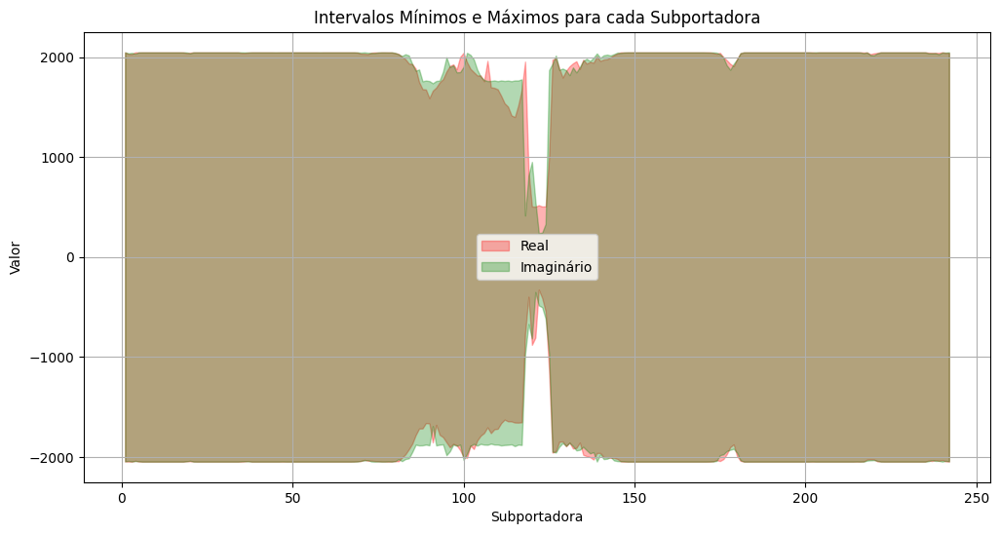

In [14]:
import numpy as np
def plot_intervalos_min_max_subportadoras(min_real, max_real, min_imag, max_imag):
  fig, ax = plt.subplots(figsize=(12, 6))
  subcarriers = np.arange(1, 243)  # Subportadoras de 1 a 242

  # Plotando os intervalos
  ax.fill_between(subcarriers, min_real, max_real, color='red', alpha=0.3, label='Real')
  ax.fill_between(subcarriers, min_imag, max_imag, color='green', alpha=0.3, label='Imaginário')

  # Configurando o gráfico
  ax.set_title('Intervalos Mínimos e Máximos para cada Subportadora')
  ax.set_xlabel('Subportadora')
  ax.set_ylabel('Valor')
  ax.legend()
  plt.grid()
  plt.show()


plot_intervalos_min_max_subportadoras(min_real, max_real, min_imag, max_imag)

## Ponto importante
- algumas subportadoras tem intervalo bem diferente. Nesses casos talvez seja interessante reescalar o valor para facilitar o gradiente descendente.

- Subportadora 118:  Real: [-771.0, 1954.0]  Imaginário [-972.0, 415.0]
- Subportadora 119:  Real: [-398.0, 867.0]  Imaginário [-671.0, 815.0]
- Subportadora 120:  Real: [-879.0, 505.0]  Imaginário [-815.0, 951.0]
- Subportadora 121:  Real: [-807.0, 503.0]  Imaginário [-351.0, 562.0]
- Subportadora 122:  Real: [-327.0, 518.0]  Imaginário [-484.0, 239.0]
- Subportadora 123:  Real: [-411.0, 505.0]  Imaginário [-503.0, 244.0]
- Subportadora 124:  Real: [-545.0, 506.0]  Imaginário [-618.0, 331.0]
- Subportadora 125:  Real: [-1131.0, 999.0]  Imaginário [-967.0, 1869.0]


In [ ]:
mpl.rcParams['animation.embed_limit'] = 30 * 1024 * 1024  # 30 MB

def plot_mat(mat_file_name, window_size=1000, step=100, output_dir='./SAIDAS', n_samples=100000):
  if os.path.exists(output_file):
    print(f'Arquivo {output_file} já existe. Pulando...')
    return
  
  with h5py.File(mat_file_name, 'r') as f:
    data = f['csi'][:] 

  file_path_splited = mat_file_name.split('/')
  test = file_path_splited[2]
  environment = file_path_splited[3]
  monitor = file_path_splited[6]
  activity = file_path_splited[8].split('.')[0]
  output_file = f'{output_dir}/02-espectograma_{test}_{environment}_{monitor}_{activity}.mp4'

  matrix = data.T[:n_samples,:]
  amplitude = matrix['real']
  phase = matrix['imag']
  combined = np.sqrt(amplitude**2 + phase**2)

  frames = (len(amplitude) - window_size) // step

  # Configurando a figura
  fig, ax = plt.subplots(figsize=(3, 6))
  heatmap = ax.imshow(combined[0:window_size].T,
                      aspect='auto', cmap='viridis',
                      origin='lower',
                      extent=[0, window_size, 0, 241])

  ax.set_xlabel('Tempo (janela de amostras)')
  ax.set_ylabel('Subportadoras')
  titulo = f'{test} {environment} {monitor} {activity}'
  title = ax.set_title(titulo)

  # Função de atualização
  def update(frame):
      start = frame * step
      end = start + window_size
      data = combined[start:end].T
      heatmap.set_data(data)
      heatmap.set_extent([start, end, 0, 241])
      return heatmap, title

  # Criando a animação
  ani = animation.FuncAnimation(fig, update, frames=frames, interval=100, blit=True)

  ani.save(output_file, writer='ffmpeg', fps=30)

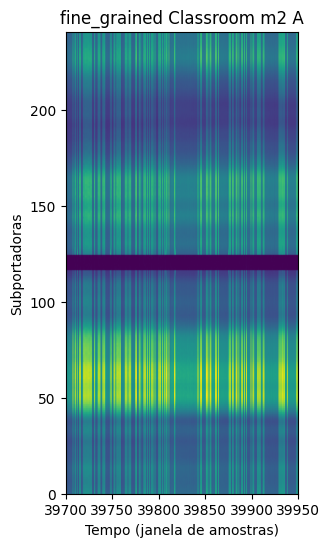

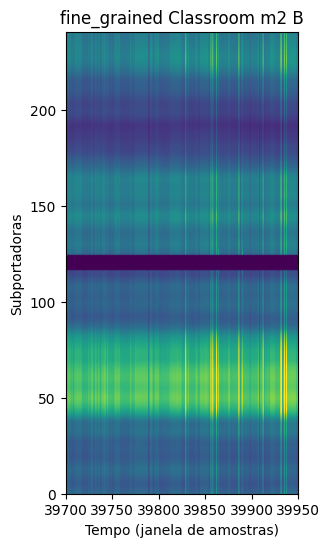

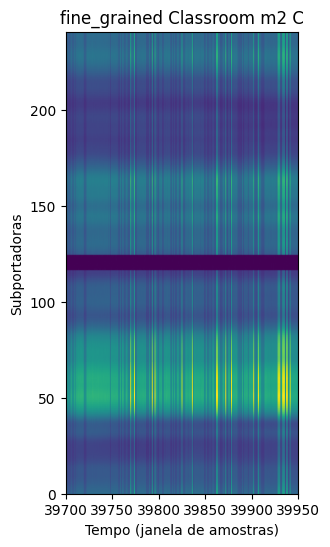

In [16]:
mats = [
  '../Data/fine_grained/Classroom/80MHz/3mo/m2/A/A.mat',
  '../Data/fine_grained/Classroom/80MHz/3mo/m2/B/B.mat',
  '../Data/fine_grained/Classroom/80MHz/3mo/m2/C/C.mat'
]
for mat_file_name in mats:
  plot_mat(mat_file_name, n_samples=40000, window_size=250, step=50, output_dir='./SAIDAS')


In [17]:
!ffmpeg -y -i SAIDAS/02-espectograma_fine_grained_Classroom_m2_A.mp4 -i SAIDAS/02-espectograma_fine_grained_Classroom_m2_B.mp4 -i SAIDAS/02-espectograma_fine_grained_Classroom_m2_C.mp4 -filter_complex "hstack=inputs=3" SAIDAS/02-espectograma_fine_grained_Classroom_m2_ABC.mp4

ffmpeg version 6.1.1-3ubuntu5+esm2 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu4)
  configuration: --prefix=/usr --extra-version=3ubuntu5+esm2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

----
# **4. Divisão das matrizes em slots e batches**

- Cada exemplo contem 50 pacotes. (Parâmetro window_size)
- São definidos alguns subconjuntos:
  - Proximity: Train_m1, Test_m1, Train_m2, Test_m2, Train_m3, Test_m3.
  - Coarse: Train, Test.
  - Fine grained: Train_m1, Test_m1, Train_m2, Test_m2, Train_m3, Test_m3.
  
**Saída**
- Cada batch é uma 50 × 242. 50 pacotes por 242 subportadoras.
- Não percebi agregação e nem normalização.


**Seleção do dado para cada Slot**
- Os índices não começam em zero e existe um pequeno intervalo ("gap") de amostras entre conjuntos de treino e teste para evitar sobreposição.
- Além disso, 5 janelas (equivalentes a 5 × 50 amostras) são descartadas no início e no final de cada slot, reduzindo ruídos de borda.



In [18]:
# Essas variáveis estão no código Matlab e definem os intervalos de cada Slot
# A quantidade total de amostras nos arquivos de entrada é fixada em 814 (um "número mágico" pré-definido).
# Os índices dos slots são determinados com base em divisões proporcionais desse valor, criando separações entre treino e teste.
proximity_data = {
  'Task': ["Train_m1", "Test_m1", "Train_m2", "Test_m2", "Train_m3", "Test_m3"],
  'Start': [5, 180, 245, 427, 490, 672],
  'End': [180, 240, 425, 485, 670, 730]
}

coarse_data = {
  'Task': ["Train", "Test"],
  'Start': [5, 242],
  'End': [240, 300]
}

fine_grained = {
  'Task': ["Train_m1", "Test_m1", "Train_m2", "Test_m2", "Train_m3", "Test_m3"],
  'Start': [5, 180, 245, 427, 490, 672],
  'End': [180, 240, 425, 485, 670, 730]    
}

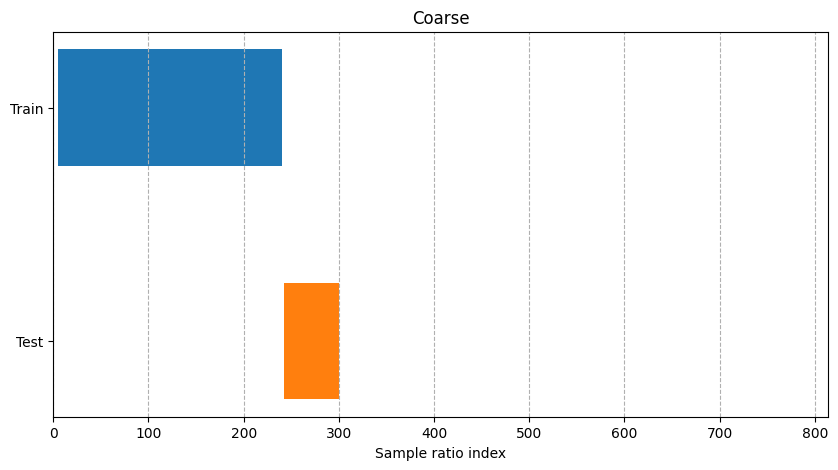

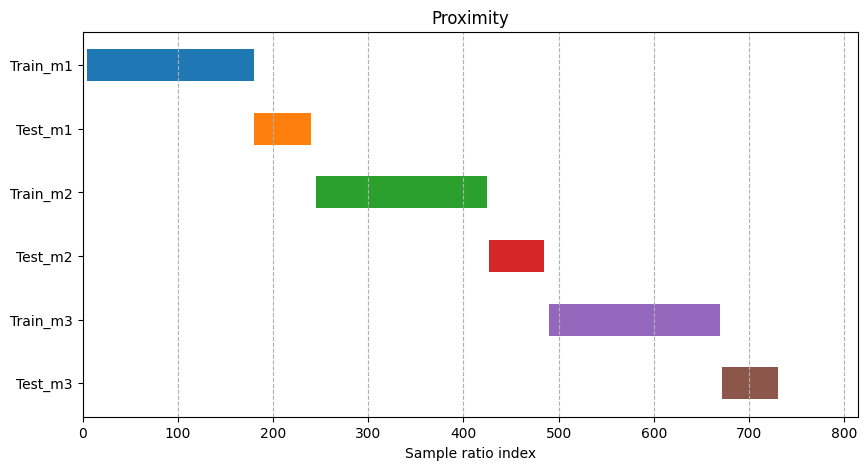

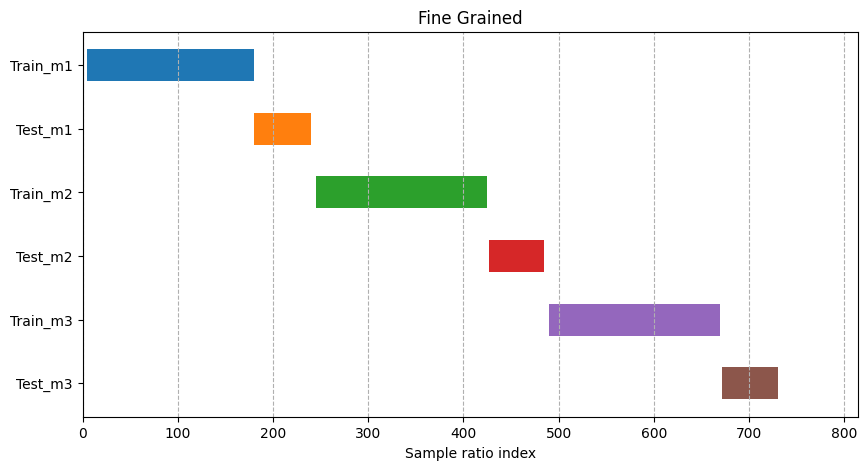

In [19]:
def plot_slots(data, title):
  df = pd.DataFrame(data)
  df['Duration'] = (df['End'] - df['Start'])
  fig, ax = plt.subplots(1, figsize=(10, 5))
  for i in range(len(df)):
    ax.barh(y=i, width=df['Duration'][i], left=df['Start'][i], height=0.5)

  ax.set_yticks(range(len(df)))
  ax.set_yticklabels(df['Task'])
  ax.set_xlabel('Sample ratio index')
  ax.set_xlim(0, 814)
  ax.invert_yaxis()
  ax.grid(axis='x', linestyle='--')
  plt.title(title)

plot_slots(coarse_data, "Coarse")
plot_slots(proximity_data, "Proximity")
plot_slots(fine_grained, "Fine Grained")

In [20]:
def summarize_batches(output='SAIDAS/03-batch_summary.csv'):
  if os.path.exists(output):
    return pd.read_csv(output)
  else:
    df_proto = {
      'test': [],
      'environment': [],
      'monitor': [],
      'slot': [],
      'activity': [],
      'shape0': [],
      'shape1': [],
      'file_path': []
    }

    def getShape(mat_file_path):
      data = scipy.io.loadmat(mat_file_path)
      return data['csi_mon'].shape


    file_paths = Path('../Data').rglob('*.mat')

    for file_path in tqdm(sorted(file_paths)):
      file_path = str(file_path)

      if 'Slots' in file_path:
        file_path_splited = file_path.split('/')
        test = file_path_splited[2]
        environment = file_path_splited[3]
        monitor = file_path_splited[6]
        slot = file_path_splited[8]
        activity = file_path_splited[9].split('_')[0]
        shape0, shape1 = getShape(file_path)
        file_path = file_path_splited[10]
        df_proto['test'].append(test)
        df_proto['environment'].append(environment)
        df_proto['monitor'].append(monitor)
        df_proto['slot'].append(slot)
        df_proto['activity'].append(activity)
        df_proto['shape0'].append(shape0)
        df_proto['shape1'].append(shape1)
        df_proto['file_path'].append(file_path)
    df = pd.DataFrame(data)
    df['Duration'] = (df['End'] - df['Start'])
    return df[['Task', 'Start', 'End', 'Duration']].to_csv(output, index=False)
  
batches_summary = summarize_batches()
print(f'Total de batches: {len(batches_summary)}')
batches_summary.head()

Total de batches: 2496403


,test,environment,monitor,slot,activity,shape0,shape1,file_path
0,coarse,Classroom,m1,Test,A,50,242,batch_0.mat
1,coarse,Classroom,m1,Test,A,50,242,batch_1.mat
2,coarse,Classroom,m1,Test,A,50,242,batch_10.mat
3,coarse,Classroom,m1,Test,A,50,242,batch_100.mat
4,coarse,Classroom,m1,Test,A,50,242,batch_101.mat


In [21]:
n_pacotes_original = mat_summary['shape1'].sum()
n_pacotes_apos_batches = batches_summary['shape0'].sum()

print(f"Pacotes originais: {n_pacotes_original}")
print(f"Pacotes após batches: {n_pacotes_apos_batches}")
print(f'Diferença: {n_pacotes_original - n_pacotes_apos_batches} pacotes')
print(f'O número de pacotes do batches correspondem a {n_pacotes_apos_batches / n_pacotes_original * 100:.2f}% do número de pacotes originais')

Pacotes originais: 218927963
Pacotes após batches: 124820150
Diferença: 94107813 pacotes
O número de pacotes do batches correspondem a 57.01% do número de pacotes originais


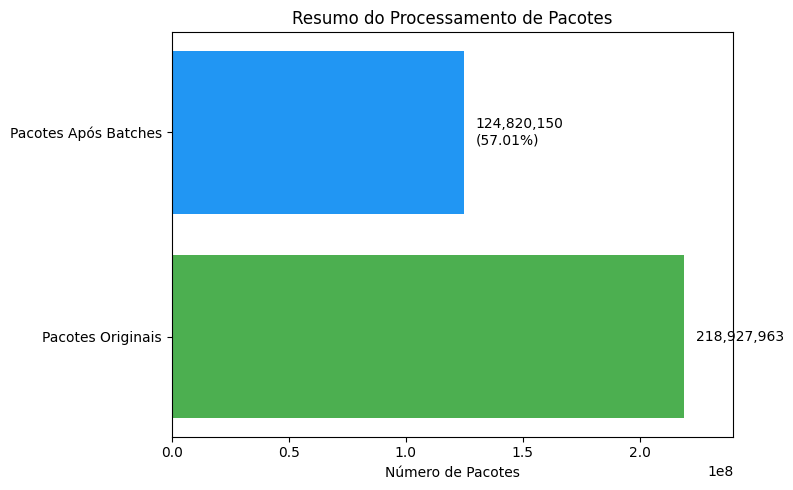

In [22]:
def plot_resumo_processamento_batches():
  percentual = n_pacotes_apos_batches / n_pacotes_original * 100

  labels = ['Pacotes Originais', 'Pacotes Após Batches']
  values = [n_pacotes_original, n_pacotes_apos_batches]
  colors = ['#4CAF50', '#2196F3']

  # Plot
  fig, ax = plt.subplots(figsize=(8, 5))
  bars = ax.barh(labels, values, color=colors)

  # Adiciona os valores nos gráficos
  for i, bar in enumerate(bars):
      width = bar.get_width()
      if i == 1:  # para "Pacotes Após Batches"
          texto = f'{width:,}\n({percentual:.2f}%)'
      else:
          texto = f'{width:,}'
      ax.text(width + 5e6, bar.get_y() + bar.get_height() / 2, texto, va='center', fontsize=10)

  # Título e eixos
  ax.set_xlabel('Número de Pacotes')
  ax.set_title('Resumo do Processamento de Pacotes')
  plt.xlim(0, 240_000_000)
  plt.tight_layout()

plot_resumo_processamento_batches()

----
# **5. Criando os CSVs**

A geração de CSV é realizada utilizando script em python que estão no diretório ```SiMWiSense/Python_code/```
Este script é bastante rápido, com execução praticamente instantânea.

Principais observações:
- Os arquivos CSV gerados contêm duas colunas: filename e label.
- A geração dos arquivos respeita a divisão em batches e slots feita no passo anterior.
- Não parece haver qualquer tipo de normalização nos valores gerados.


In [2]:
def summarize_csvs(output='SAIDAS/04-csv_summary.csv'):
  if os.path.exists(output):
    return pd.read_csv(output)
  else:
    
    def add_shape(row_csv_df, base_folder):
      mat_file_path = row_csv_df['filename']
      data = scipy.io.loadmat(f'{base_folder}/{mat_file_path}')
      row_csv_df['nr_packets'], row_csv_df['nr_subcarriers'] = data['csi_mon'].shape                     
      return row_csv_df


    df_all = pd.DataFrame({
      'test': [],
      'environment': [],
      'monitor': [],
      'slot': [],
      'csv_file_path': [], 
      'filename': [],
      'label':  [],
      'nr_packets': [],
      'nr_subcarriers': []
    })

    file_paths = Path('../Data').rglob('*.csv')

    for file_path in tqdm(sorted(file_paths)):
      # print(f'Processing {file_path}')
      file_path = str(file_path)
      df = pd.read_csv(file_path)
      base_folder = os.path.dirname(file_path)
      df = df.apply(add_shape, axis=1, base_folder=base_folder)
      file_path_splited = file_path.split('/')
      test = file_path_splited[2]
      environment = file_path_splited[3]
      monitor = file_path_splited[6]
      slot = file_path_splited[8]
      df['test'] = test
      df['environment'] = environment
      df['monitor'] = monitor
      df['slot'] = slot 
      df['csv_file_path'] = file_path
      df = df[['test', 'environment', 'monitor', 'slot', 'csv_file_path', 'filename', 'label', 'nr_packets', 'nr_subcarriers']]
      df_all = pd.concat([df_all, df], ignore_index=True)

    # para anotar se faz parte do conjunto de validação
    df_all['set'] = df_all['csv_file_path'].apply(lambda x: 'val' if 'val' in x else ('test' if 'test' in x else 'train'))

    df_all.to_csv(output, index=False)
    return df_all
  
csv_summary = summarize_csvs()
csv_summary.head()

,test,environment,monitor,slot,csv_file_path,filename,label,nr_packets,nr_subcarriers,set
0,coarse,Classroom,m1,Test,../Data/coarse/Classroom/80MHz/3mo/m1/Slots/Te...,C_batch/batch_278.mat,C,50.0,242.0,test
1,coarse,Classroom,m1,Test,../Data/coarse/Classroom/80MHz/3mo/m1/Slots/Te...,C_batch/batch_533.mat,C,50.0,242.0,test
2,coarse,Classroom,m1,Test,../Data/coarse/Classroom/80MHz/3mo/m1/Slots/Te...,C_batch/batch_350.mat,C,50.0,242.0,test
3,coarse,Classroom,m1,Test,../Data/coarse/Classroom/80MHz/3mo/m1/Slots/Te...,C_batch/batch_57.mat,C,50.0,242.0,test
4,coarse,Classroom,m1,Test,../Data/coarse/Classroom/80MHz/3mo/m1/Slots/Te...,C_batch/batch_532.mat,C,50.0,242.0,test


In [24]:
n_pacotes_csvs = csv_summary['nr_packets'].sum()

print(f"Pacotes originais: {n_pacotes_original}")
print(f"Pacotes após batches: {n_pacotes_apos_batches}")
print(f"Pacotes após csvs: {n_pacotes_csvs}")

print(f'Diferença: {n_pacotes_apos_batches - n_pacotes_csvs} pacotes com o passo anterio')

Pacotes originais: 218927963
Pacotes após batches: 124820150
Pacotes após csvs: 124820150.0
Diferença: 0.0 pacotes com o passo anterio


In [25]:
def plot_dist(df, column_to_count, title, sort_ascending=False):
  total = len(df)

  if sort_ascending:
    order = df[column_to_count].sort_values().unique()
  else:
    order = df[column_to_count].value_counts().index


  ax = sns.countplot(x=column_to_count, data=df, order=order)

  # Adiciona os percentuais acima de cada barra
  for p in ax.patches:
      count = p.get_height()
      percentage = f'{100 * count / total:.1f}%'
      ax.text(p.get_x() + p.get_width() / 2., count + 0.5, percentage,
              ha='center', va='bottom', fontsize=10)

  plt.title(title)
  plt.xlabel(column_to_count)
  plt.ylabel('Count')
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

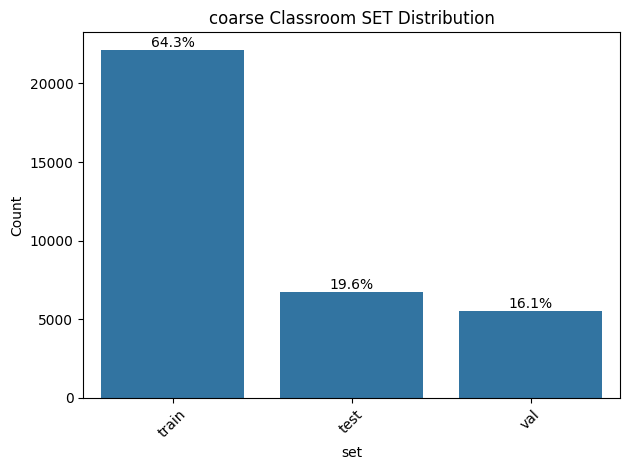

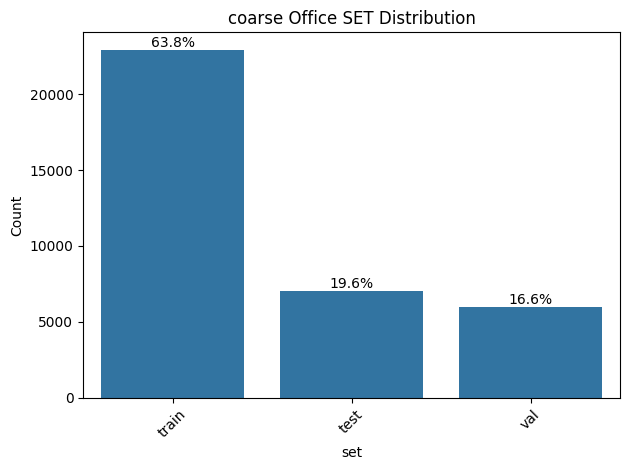

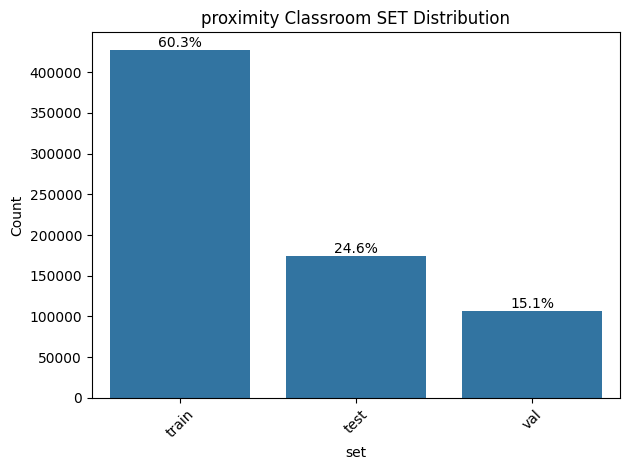

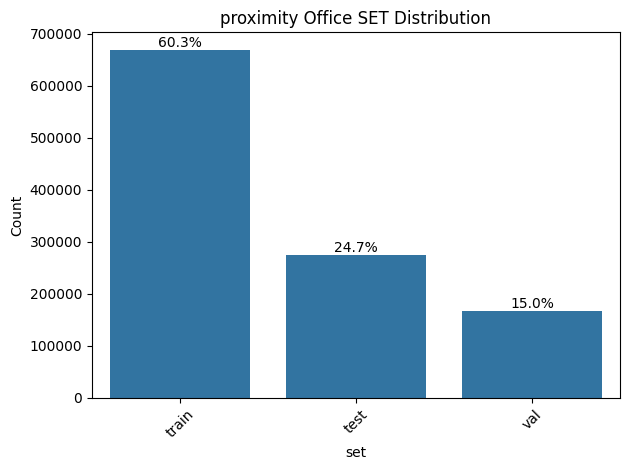

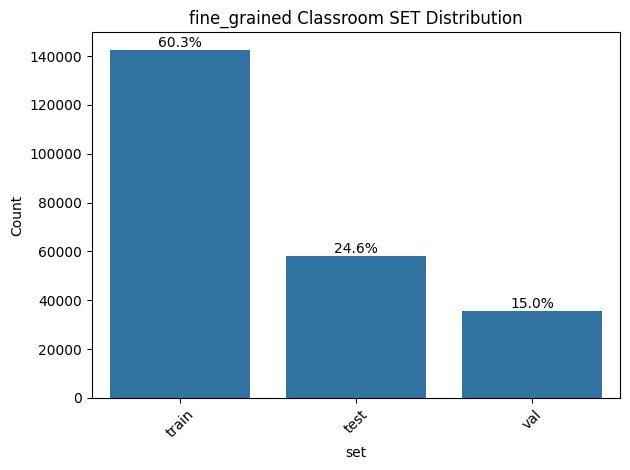

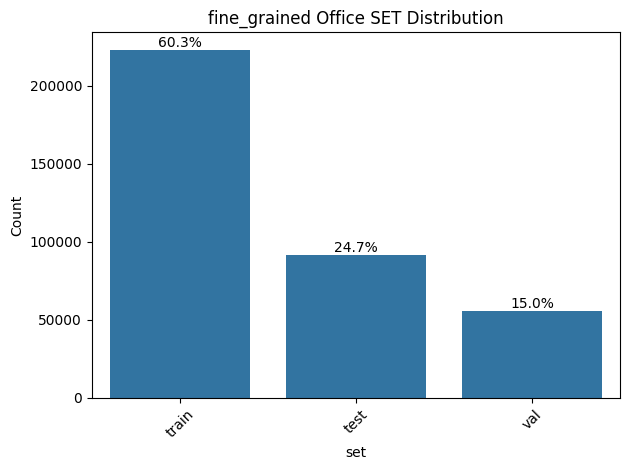

In [26]:
tests = ['coarse', 'proximity', 'fine_grained']
environments = ['Classroom', 'Office']

for test in tests:
  for environment in environments:
    subset = csv_summary.loc[(csv_summary['test'] == test) & (csv_summary['environment'] == environment)]
    title = f'{test} {environment} SET Distribution'
    plot_dist(subset, 'set', title)

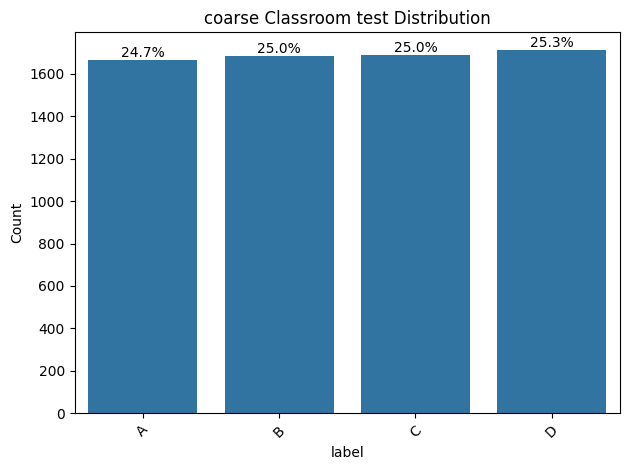

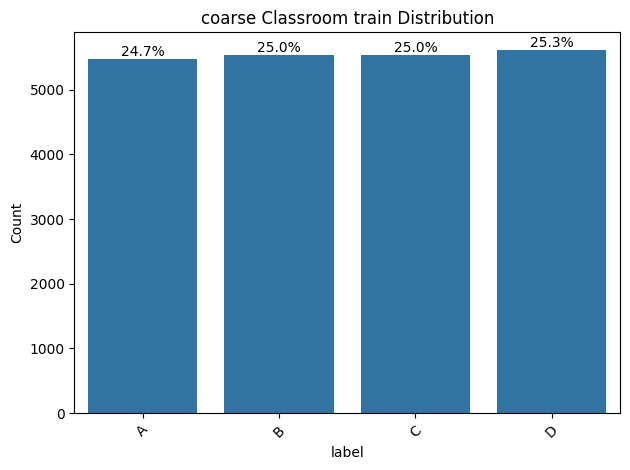

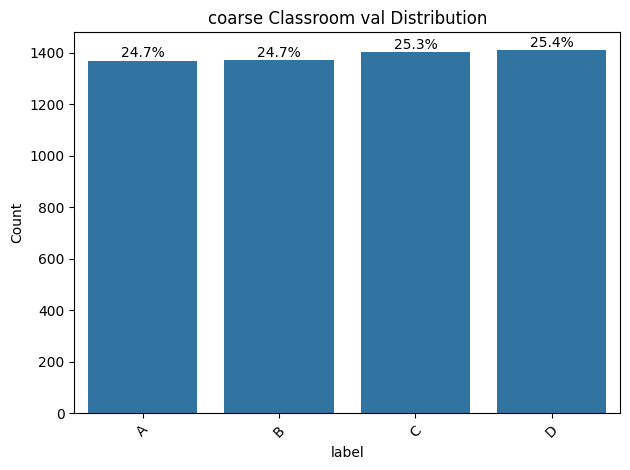

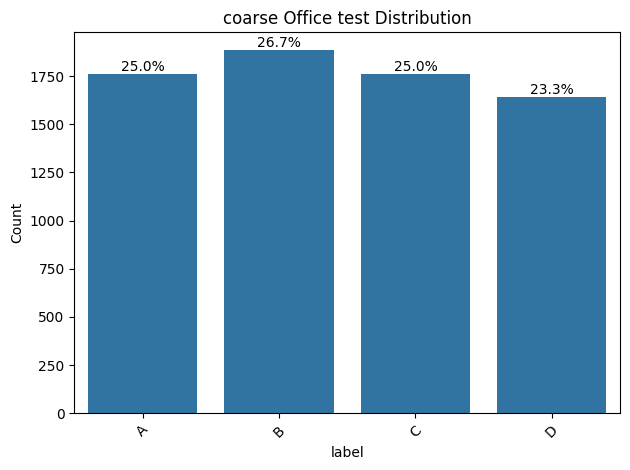

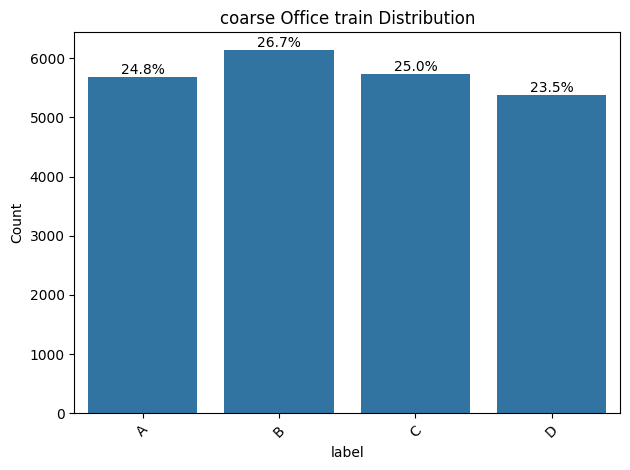

...

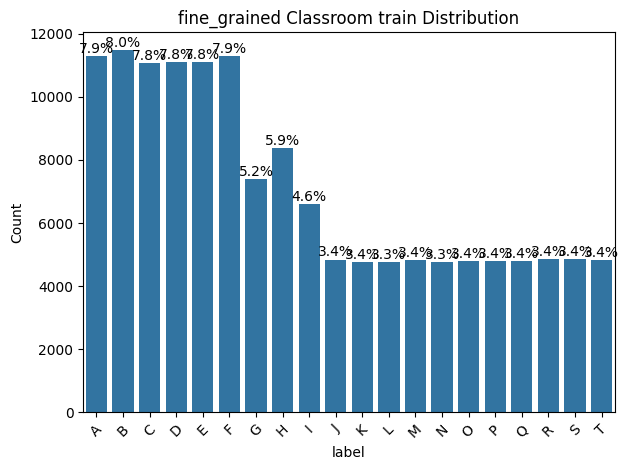

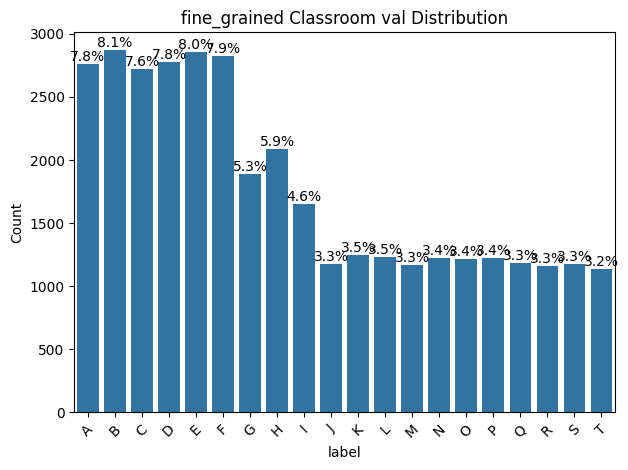

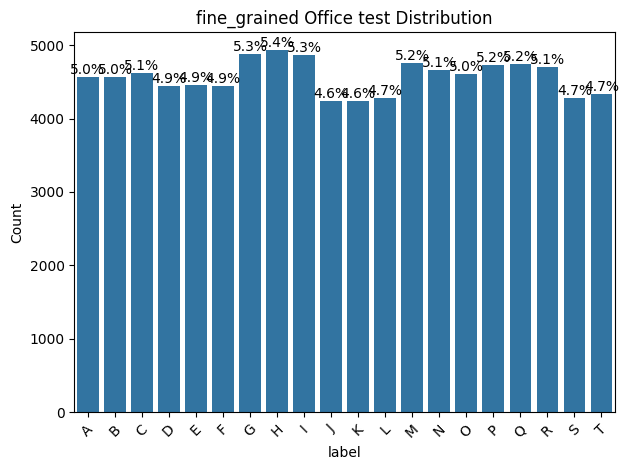

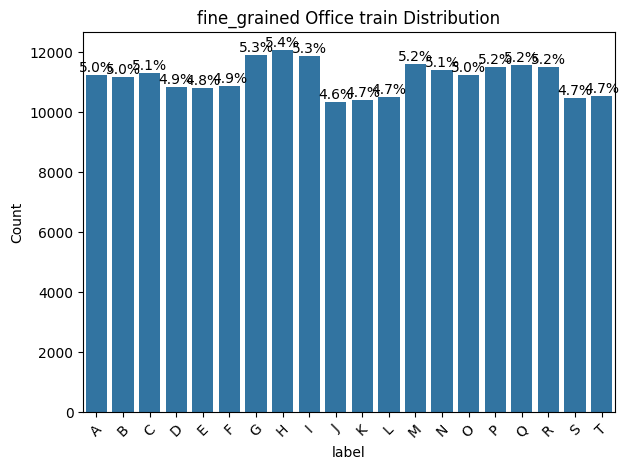

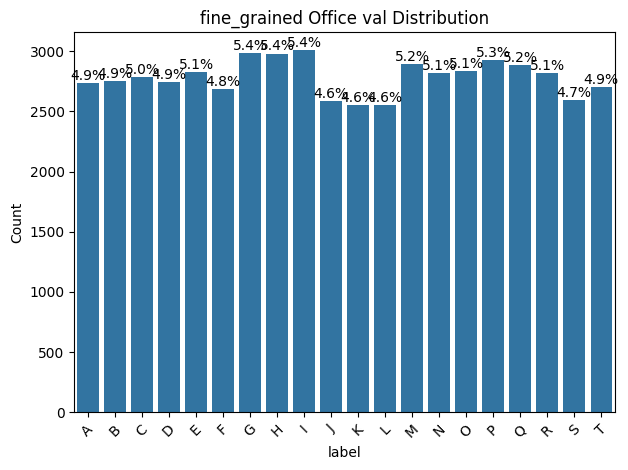

In [27]:
tests = ['coarse', 'proximity', 'fine_grained']
environments = ['Classroom', 'Office']

for test in tests:
  for environment in environments:
    subset = csv_summary.loc[(csv_summary['test'] == test) & (csv_summary['environment'] == environment)]
    sets = subset['set'].unique()
    for sset in sets:
      subset_set = subset[subset['set'] == sset]
      title = f'{test} {environment} {sset} Distribution'
      plot_dist(subset_set, 'label', title, sort_ascending=True)


# Bias no dataset

- As ativadades não estão balanceadas no classroom.
- Possível problema: Quando ele justifica a melhor performance do modelo treinado no Classroom e avaliado no Office, esse desbalanceamento pode fazer o modelo treinado no Classroom performar pior no Office de maneira artificial e não clara no texto. **Figure 15 Performance of FREL in simultaneous activity sensing with new untrained environments**

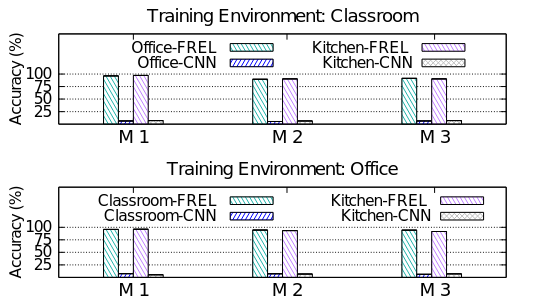

----

# **6. Exemplos de amostras**

In [28]:
# Exemplo dos csvs gerados
csv_path = '../Data/proximity/Classroom/80MHz/3mo/m1/Slots/Train_m1/train_set.csv'
df = pd.read_csv(csv_path)
df.sample(n=10)

,filename,label
23695,B_batch/batch_2152.mat,B
33095,H_batch/batch_1054.mat,H
18136,T_batch/batch_511.mat,T
33726,H_batch/batch_1517.mat,H
30698,S_batch/batch_1184.mat,S
6981,R_batch/batch_933.mat,R
802,O_batch/batch_1825.mat,O
8053,R_batch/batch_1660.mat,R
29128,A_batch/batch_4261.mat,A
42076,D_batch/batch_2459.mat,D


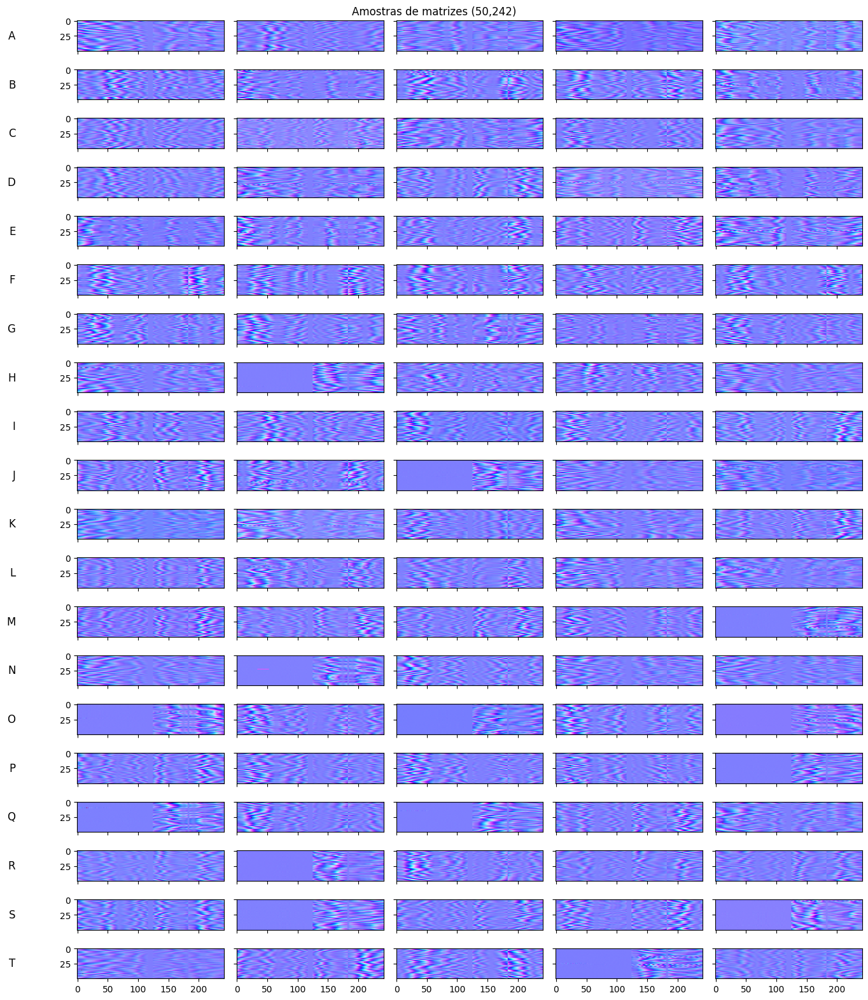

In [29]:

labels = sorted(csv_summary['label'].unique().tolist())
num_rows = len(labels)
num_cols = 5


largura_pixels = num_cols * 275
altura_pixels = num_rows * 80
dpi = 100 

figsize = (largura_pixels / dpi, altura_pixels / dpi)

fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize, sharex=True, sharey=True, squeeze=False)

row_index, col_index = 0, 0

for row_index in range(num_rows):
  sample_indexes = csv_summary[csv_summary['label'] == labels[row_index]].sample(num_cols).index
  for col_index in range(num_cols):
    sample_index = sample_indexes[col_index]
    csv_path = csv_summary.loc[sample_index]['csv_file_path']
    sample_file_path = csv_summary.loc[sample_index]['filename']
    base_folder = os.path.dirname(csv_path)
    sample_file_path = os.path.join(base_folder, sample_file_path)
    data = scipy.io.loadmat(sample_file_path)['csi_mon']

    real_part = np.real(data)
    imag_part = np.imag(data)
    real_part_norm = (real_part - real_part.min()) / (real_part.max() - real_part.min())
    imag_part_norm = (imag_part - imag_part.min()) / (imag_part.max() - imag_part.min())

    h, w = real_part.shape  # altura e largura
    rgb_image = np.zeros((h, w, 3))

    rgb_image[..., 0] = real_part_norm  # Red
    rgb_image[..., 1] = imag_part_norm  # Green
    rgb_image[..., 2] = (real_part_norm * imag_part_norm)**0.00001


    axes[row_index][col_index].imshow(rgb_image, cmap='viridis')
    # axes[row_index][col_index].axis('off')  
    if col_index == 0:
      axes[row_index][col_index].set_ylabel(labels[row_index], rotation=0, labelpad=50, va='center', ha='right', fontsize=12)

  # plt.subplots_adjust(left=0, right=1, top=1, bottom=0) 
  plt.tight_layout()
  plt.suptitle(f'Amostras de matrizes (50,242)')

# t-SNE



In [3]:
def plot_tsne_activities_by_test_environment_monitor_slot(csv_summary, test, environment, monitor, slot, set_set, subsample=None, seed=42, perplexity=30):
  output_file = f'SAIDAS/05-tsne_activities_by_{test}_{environment}_{monitor}_{slot}_{set_set}.png'
  if os.path.exists(output_file):
    img = plt.imread(output_file)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    return
  
  subset = csv_summary.loc[
    (csv_summary['test'] == test)
    &(csv_summary['environment'] == environment)
    &(csv_summary['set'] == set_set)
    &(csv_summary['monitor'] == monitor)
    &(csv_summary['slot'] == slot)
  ]

  if subsample is not None:
    subset = subset.sample(n=subsample, random_state=seed)

  X = np.zeros((len(subset), 50 * 242 *2))

  for i in range(len(subset)):
    csv_path = subset.iloc[i]['csv_file_path']
    sample_file_path = subset.iloc[i]['filename']
    base_folder = os.path.dirname(csv_path)
    sample_file_path = os.path.join(base_folder, sample_file_path)
    data = scipy.io.loadmat(sample_file_path)['csi_mon']
    real_part = np.real(data)
    imag_part = np.imag(data)
    X[i] = np.concatenate((real_part.flatten(), imag_part.flatten()))

  X = X.astype(np.float32)
  labels = subset['label'].tolist()

  label_encoder = LabelEncoder()
  numeric_labels = label_encoder.fit_transform(labels)
  class_names = label_encoder.classes_

  colormap = 'tab20' if len(labels) > 10 else 'tab10'


  tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
  X_embedded = tsne.fit_transform(X)
  plt.figure(figsize=(8,6))
  plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=numeric_labels, cmap=colormap, s=5)
  plt.title(f't-SNE test: {test}, environment: {environment}, monitor: {monitor}, slot: {slot}, set: {set_set}')
  plt.xlabel('t-SNE Component 1')
  plt.ylabel('t-SNE Component 2')
  plt.grid(True)
  plt.tight_layout()

  plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label=class_name, markersize=5, markerfacecolor=plt.cm.tab10(i)) for i, class_name in enumerate(class_names)], loc='upper right', bbox_to_anchor=(1.15, 1))

  plt.savefig(output_file, dpi=300, bbox_inches='tight')
  plt.show()

  



In [4]:
def plot_tsne_monitor_by_label_test_environment_slot(csv_summary, test, environment, slot, set_set, subsample=None, seed=42, perplexity=30, label='A'):
  output_file = f'SAIDAS/05-tsne_monitor_by_{label}_{test}_{environment}_{slot}_{set_set}.png'
  if os.path.exists(output_file):
    img = plt.imread(output_file)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    return
  
  subset = csv_summary.loc[
    (csv_summary['test'] == test)
    &(csv_summary['label'] == label)
    &(csv_summary['environment'] == environment)
    &(csv_summary['set'] == set_set)
    &(csv_summary['slot'] == slot)
  ]

  if subsample is not None:
    subset = subset.sample(n=subsample, random_state=seed)

  X = np.zeros((len(subset), 50 * 242 *2))

  for i in range(len(subset)):
    csv_path = subset.iloc[i]['csv_file_path']
    sample_file_path = subset.iloc[i]['filename']
    base_folder = os.path.dirname(csv_path)
    sample_file_path = os.path.join(base_folder, sample_file_path)
    data = scipy.io.loadmat(sample_file_path)['csi_mon']
    real_part = np.real(data)
    imag_part = np.imag(data)
    X[i] = np.concatenate((real_part.flatten(), imag_part.flatten()))

  X = X.astype(np.float32)

  labels = subset['monitor'].tolist()

  label_encoder = LabelEncoder()
  numeric_labels = label_encoder.fit_transform(labels)
  class_names = label_encoder.classes_

  colormap = 'tab20' if len(labels) > 10 else 'tab10'

  tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
  X_embedded = tsne.fit_transform(X)
  plt.figure(figsize=(8,6))
  plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=numeric_labels, cmap=colormap, s=5)
  plt.title(f't-SNE label: {label} test: {test}, environment: {environment}, slot: {slot}, set: {set_set}')
  plt.xlabel('t-SNE Component 1')
  plt.ylabel('t-SNE Component 2')
  plt.grid(True)
  plt.tight_layout()

  plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label=class_name, markersize=5, markerfacecolor=plt.cm.tab10(i)) for i, class_name in enumerate(class_names)], loc='upper right', bbox_to_anchor=(1.15, 1))

  plt.savefig(output_file, dpi=300, bbox_inches='tight')
  plt.show()


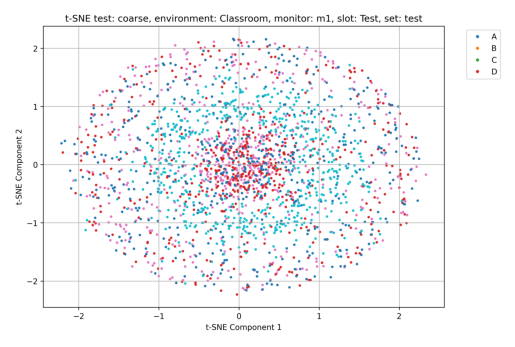

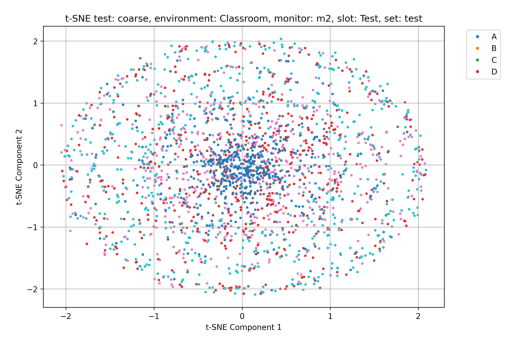

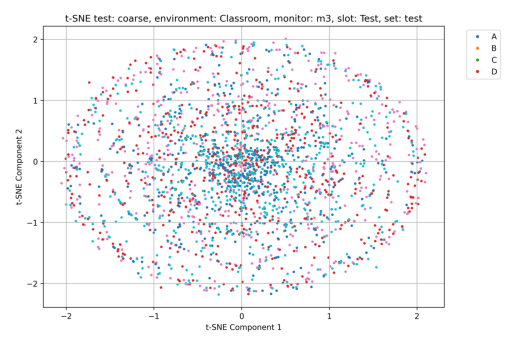

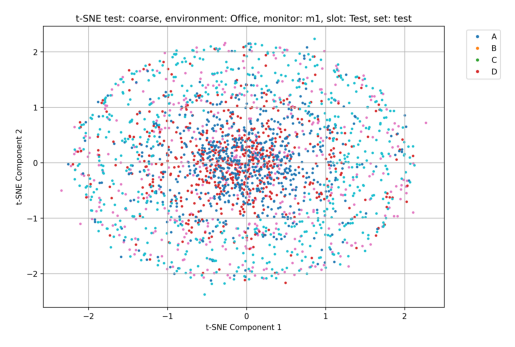

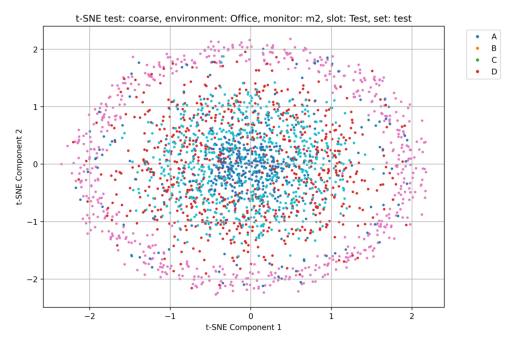

...

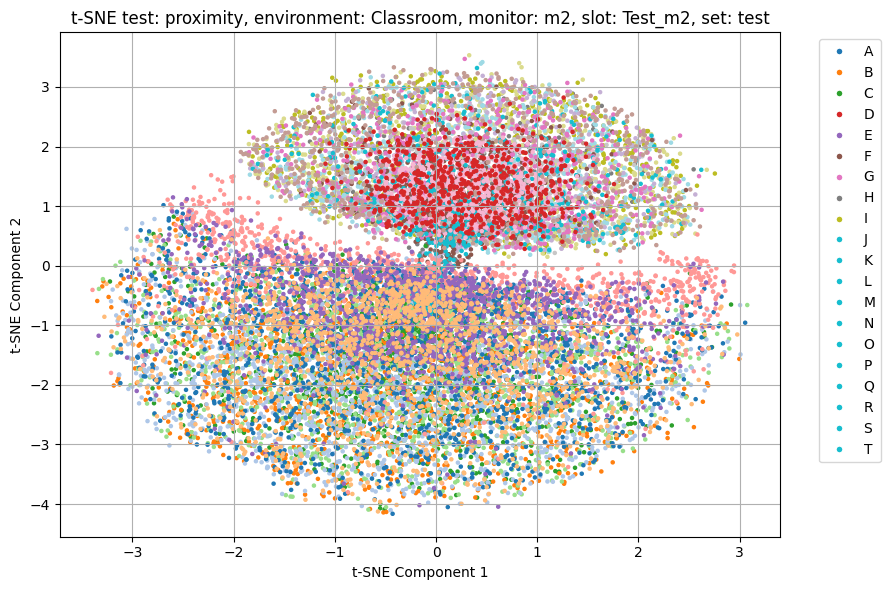

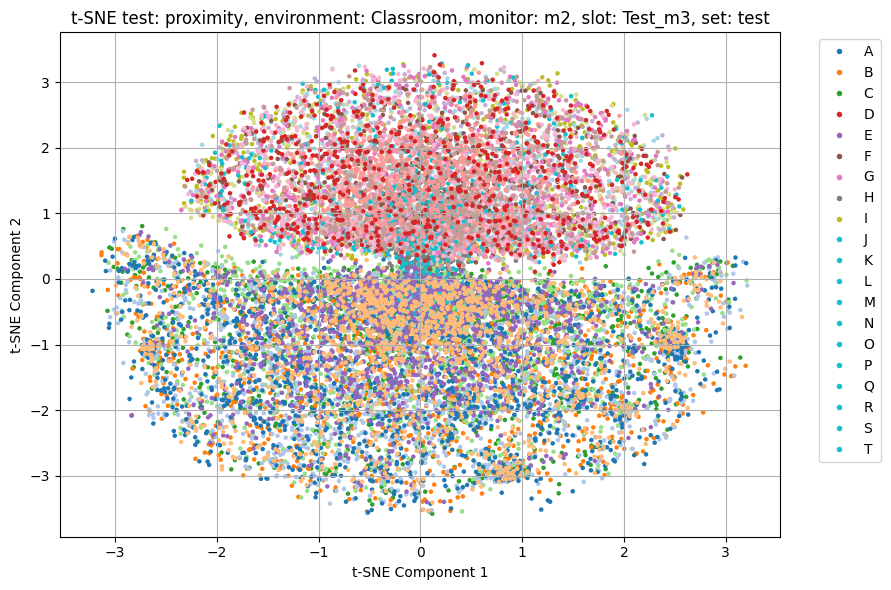

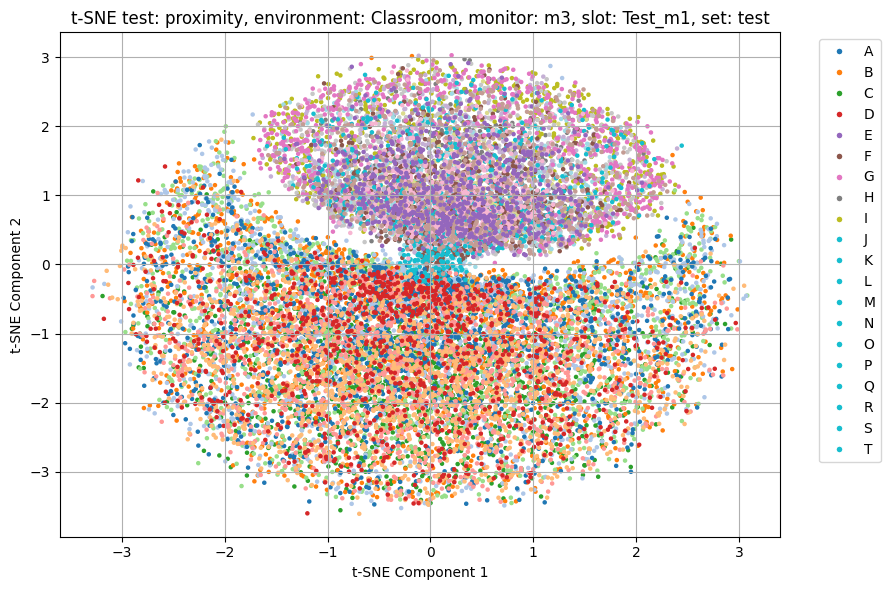

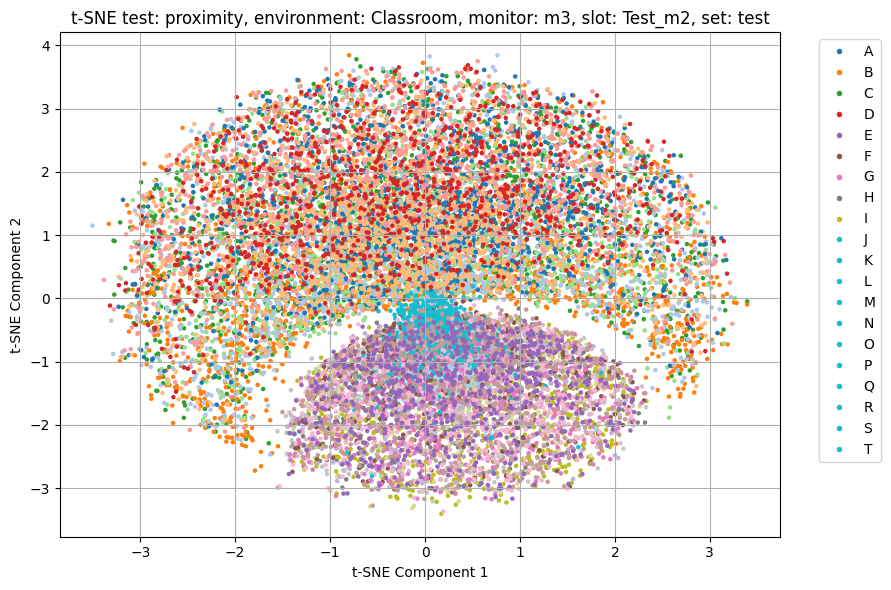

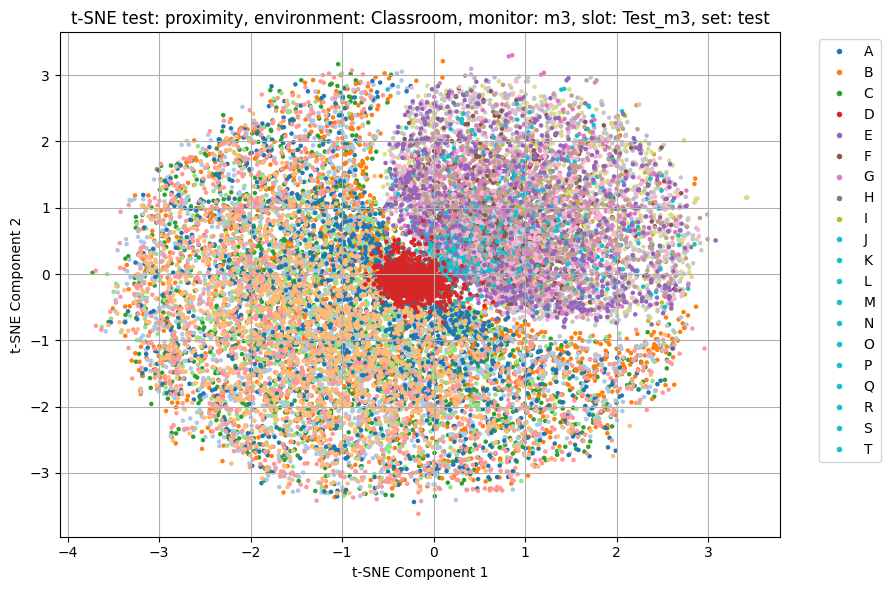

In [ ]:
csv_summary_activities_subsets = csv_summary.loc[csv_summary['set'] == 'test'][['test', 'environment', 'monitor', 'slot']].drop_duplicates()

for _, row in csv_summary_activities_subsets.iterrows():
  test = row['test']
  environment = row['environment']
  monitor = row['monitor']
  slot = row['slot']
  set_set = 'test'
  plot_tsne_activities_by_test_environment_monitor_slot(csv_summary, test, environment, monitor, slot, set_set, perplexity=100)



csv_summary_activityA_subsets = csv_summary.loc[(csv_summary['set'] == 'test') & (csv_summary['label'] == 'A')][['test', 'environment', 'slot']].drop_duplicates()


for _, row in csv_summary_activityA_subsets.iterrows():
  label = 'A'
  test = row['test']
  environment = row['environment']
  slot = row['slot']
  set_set = 'test'
  plot_tsne_monitor_by_label_test_environment_slot(csv_summary, test, environment, slot, set_set, perplexity=100)


----
Revisando t-sne



In [7]:
csv_summary_activities_subsets = csv_summary.loc[(csv_summary['set'] == 'test')&(csv_summary['test'] == 'coarse')][['test', 'environment', 'monitor', 'slot']].drop_duplicates()

csv_summary_activities_subsets

,test,environment,monitor,slot
0,coarse,Classroom,m1,Test
11451,coarse,Classroom,m2,Test
22920,coarse,Classroom,m3,Test
34442,coarse,Office,m1,Test
46221,coarse,Office,m2,Test
58701,coarse,Office,m3,Test


In [46]:
def plot_tsne_activities_by_test_environment_monitor_slot(csv_summary, test, environment, monitor, slot, set_set, subsample=None, seed=42, perplexity=30, polar=False):
  output_file = f'SAIDAS/05-tsne_activities_by_{test}_{environment}_{monitor}_{slot}_{set_set}.png'
  if polar:
    output_file = f'SAIDAS/05-tsne_activities_by_{test}_{environment}_{monitor}_{slot}_{set_set}_polar2.png'
    
  # if os.path.exists(output_file):
  #   img = plt.imread(output_file)
  #   plt.imshow(img)
  #   plt.axis('off')
  #   plt.show()
  #   return
  
  subset = csv_summary.loc[
    (csv_summary['test'] == test)
    &(csv_summary['environment'] == environment)
    &(csv_summary['set'] == set_set)
    &(csv_summary['monitor'] == monitor)
    &(csv_summary['slot'] == slot)
  ]

  if subsample is not None:
    subset = subset.sample(n=subsample, random_state=seed)

  X = np.zeros((len(subset), 50 * 242 *2))

  for i in range(len(subset)):
    csv_path = subset.iloc[i]['csv_file_path']
    sample_file_path = subset.iloc[i]['filename']
    base_folder = os.path.dirname(csv_path)
    sample_file_path = os.path.join(base_folder, sample_file_path)
    data = scipy.io.loadmat(sample_file_path)['csi_mon']
    real_part = np.real(data)
    imag_part = np.imag(data)
    X[i] = np.concatenate((real_part.flatten(), imag_part.flatten()))

  X = X.astype(np.float32)
  labels = subset['label'].tolist()

  label_encoder = LabelEncoder()
  numeric_labels = label_encoder.fit_transform(labels)
  class_names = label_encoder.classes_

  colormap = 'tab20' if len(labels) > 10 else 'tab10'


  tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
  X_embedded = tsne.fit_transform(X)


  if polar:
    # Convert (x, y) to (r, theta)
    # x, y = X_embedded[:, 0], X_embedded[:, 1]
    # r = np.sqrt(x**2 + y**2)
    # theta = np.arctan2(y, x)

    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, polar=True)
    # sc = ax.scatter(theta, r, c=numeric_labels, cmap=colormap, s=5)
    sc = ax.scatter(X_embedded[:, 0], X_embedded[:, 1], c=numeric_labels, cmap=colormap, s=5)
    ax.set_title(f't-SNE (Polar)\ntest: {test}, env: {environment}, monitor: {monitor}, slot: {slot}, set: {set_set}', va='bottom')
    plt.xlabel('radius')
    plt.ylabel('theta')

  else:
    plt.figure(figsize=(8, 6))
    plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=numeric_labels, cmap=colormap, s=5)
    plt.title(f't-SNE (Cartesian)\ntest: {test}, env: {environment}, monitor: {monitor}, slot: {slot}, set: {set_set}')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.grid(True)

  plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label=class_name, markersize=5, markerfacecolor=plt.cm.tab10(i)) for i, class_name in enumerate(class_names)], loc='upper right', bbox_to_anchor=(1.15, 1))

  plt.savefig(output_file, dpi=300, bbox_inches='tight')
  plt.show()



In [ ]:
for _, row in csv_summary_activities_subsets.iterrows():
  test = row['test']
  environment = row['environment']
  monitor = row['monitor']
  slot = row['slot']
  set_set = 'test'
  plot_tsne_activities_by_test_environment_monitor_slot(csv_summary, test, environment, monitor, slot, set_set, perplexity=100, polar=True)


In [27]:
def embed(csv_summary, test, environment, monitor, slot, set_set, subsample=None, seed=42, perplexity=30, polar=False):
  subset = csv_summary.loc[
    (csv_summary['test'] == test)
    &(csv_summary['environment'] == environment)
    &(csv_summary['set'] == set_set)
    &(csv_summary['monitor'] == monitor)
    &(csv_summary['slot'] == slot)
  ]

  if subsample is not None:
    subset = subset.sample(n=subsample, random_state=seed)

  X = np.zeros((len(subset), 50 * 242 *2))

  for i in range(len(subset)):
    csv_path = subset.iloc[i]['csv_file_path']
    sample_file_path = subset.iloc[i]['filename']
    base_folder = os.path.dirname(csv_path)
    sample_file_path = os.path.join(base_folder, sample_file_path)
    data = scipy.io.loadmat(sample_file_path)['csi_mon']
    real_part = np.real(data)
    imag_part = np.imag(data)
    X[i] = np.concatenate((real_part.flatten(), imag_part.flatten()))

  X = X.astype(np.float32)
  labels = subset['label'].tolist()

  label_encoder = LabelEncoder()
  numeric_labels = label_encoder.fit_transform(labels)
  class_names = label_encoder.classes_

  colormap = 'tab20' if len(labels) > 10 else 'tab10'


  tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
  return tsne.fit_transform(X), numeric_labels, colormap




In [28]:
embedings, numeric_labels, colormap = embed(csv_summary, 'coarse', 'Classroom', 'm1', 'Test', 'test', perplexity=100, polar=True)


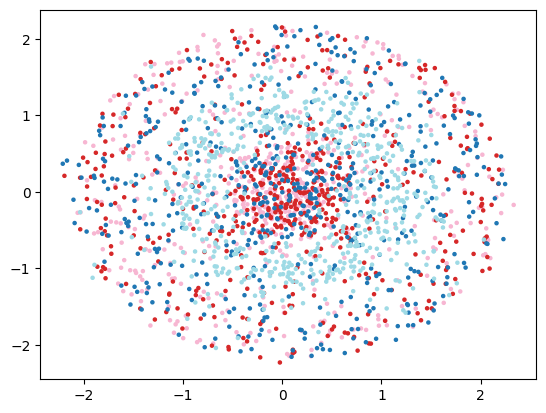

In [31]:
plt.scatter(embedings[:, 0], embedings[:, 1], c=numeric_labels, cmap=colormap, s=5)


In [33]:
x, y = embedings[:, 0], embedings[:, 1]
r = np.sqrt(x**2 + y**2)
theta = np.arctan2(y, x)

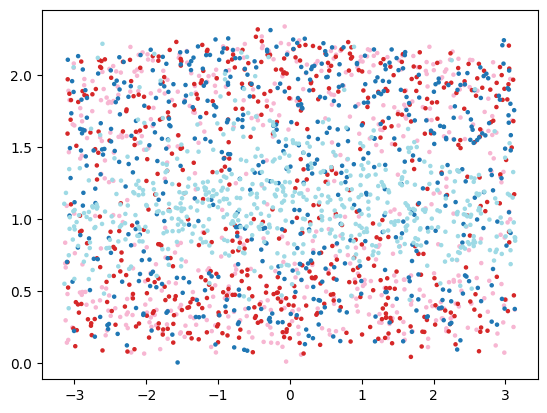

In [40]:
plt.scatter(theta, r, c=numeric_labels, cmap=colormap, s=5)
